In [1]:
import os
import random

import cv2
import numpy as np

import torch
from torch.utils.data import DataLoader
from torchvision import models

from src.resnet_yolo_early import resnet50
from yolo_loss import YoloLoss
from src.dataset import VocDetectorDataset, get_train_test
from src.eval_early import evaluate
from src.predict_early import predict_image
from src.config import VOC_CLASSES, COLORS

import matplotlib.pyplot as plt
import collections

%matplotlib inline
%load_ext autoreload
%autoreload 2

## Initialization

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
# YOLO network hyperparameters
B = 2  # number of bounding box predictions per cell
S = 14  # width/height of network output grid (larger than 7x7 from paper since we use a different network)

To implement Yolo we will rely on a pretrained classifier as the backbone for our detection network. PyTorch offers a variety of models which are pretrained on ImageNet in the [`torchvision.models`](https://pytorch.org/docs/stable/torchvision/models.html) package. In particular, we will use the ResNet50 architecture as a base for our detector. This is different from the base architecture in the Yolo paper and also results in a different output grid size (14x14 instead of 7x7).

Models are typically pretrained on ImageNet since the dataset is very large (> 1 million images) and widely used. The pretrained model provides a very useful weight initialization for our detector, so that the network is able to learn quickly and effectively.

In [4]:
load_network_path = None
pretrained = True

# use to load a previously trained network
if load_network_path is not None:
    print('Loading saved network from {}'.format(load_network_path))
    net = resnet50().to(device)
    net.load_state_dict(torch.load(load_network_path))
else:
    print('Load pre-trained model')
    net = resnet50(pretrained=pretrained).to(device)

Load pre-trained model


/home/albyyuggle/Code/CS498/venv2/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/albyyuggle/Code/CS498/venv2/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


bn1.weight
bn1.bias
bn1.running_mean
bn1.running_var
bn1.num_batches_tracked
layer1.0.conv1.weight
layer1.0.bn1.weight
layer1.0.bn1.bias
layer1.0.bn1.running_mean
layer1.0.bn1.running_var
layer1.0.bn1.num_batches_tracked
layer1.0.conv2.weight
layer1.0.bn2.weight
layer1.0.bn2.bias
layer1.0.bn2.running_mean
layer1.0.bn2.running_var
layer1.0.bn2.num_batches_tracked
layer1.0.conv3.weight
layer1.0.bn3.weight
layer1.0.bn3.bias
layer1.0.bn3.running_mean
layer1.0.bn3.running_var
layer1.0.bn3.num_batches_tracked
layer1.0.downsample.0.weight
layer1.0.downsample.1.weight
layer1.0.downsample.1.bias
layer1.0.downsample.1.running_mean
layer1.0.downsample.1.running_var
layer1.0.downsample.1.num_batches_tracked
layer1.1.conv1.weight
layer1.1.bn1.weight
layer1.1.bn1.bias
layer1.1.bn1.running_mean
layer1.1.bn1.running_var
layer1.1.bn1.num_batches_tracked
layer1.1.conv2.weight
layer1.1.bn2.weight
layer1.1.bn2.bias
layer1.1.bn2.running_mean
layer1.1.bn2.running_var
layer1.1.bn2.num_batches_tracked
layer1.

In [5]:
learning_rate = 0.003
num_epochs = 1
batch_size = 20

# Yolo loss component coefficients (as given in Yolo v1 paper)
lambda_coord = 5
lambda_noobj = 0.25

## Reading Pascal Data

Since Pascal is a small dataset (5000 in train+val) we have combined the train and val splits to train our detector. This is not typically a good practice, but we will make an exception in this case to be able to get reasonable detection results with a comparatively small object detection dataset.

The train dataset loader also using a variety of data augmentation techniques including random shift, scaling, crop, and flips. Data augmentation is slightly more complicated for detection datasets since the bounding box annotations must be kept consistent throughout the transformations.

Since the output of the detector network we train is an SxSx(B*5+C), we use an encoder to convert the original bounding box coordinates into relative grid bounding box coordinates corresponding to the expected output. We also use a decoder which allows us to convert the opposite direction into image coordinate bounding boxes.

In [6]:
train_dataset, test_dataset = get_train_test()
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset,batch_size=1,shuffle=False)

Initializing dataset
Initializing dataset


## Set up training tools

In [7]:
criterion = YoloLoss(S, B, lambda_coord, lambda_noobj)
optimizer = torch.optim.SGD(net.parameters(), lr=learning_rate, momentum=0.9, weight_decay=5e-4)
# optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)

## Train detector



Starting epoch 1 / 1
Learning Rate for this epoch: 0.001
0 / 8163
Epoch [1/1], Iter [100/8163], Loss: total=215.711, reg=31.716, containing_obj=17.184, no_obj=37.615, cls=30.543
100 / 8163
Epoch [1/1], Iter [200/8163], Loss: total=203.272, reg=29.669, containing_obj=21.308, no_obj=18.807, cls=28.917
200 / 8163
Epoch [1/1], Iter [300/8163], Loss: total=196.337, reg=28.284, containing_obj=23.596, no_obj=12.538, cls=28.188
300 / 8163
Epoch [1/1], Iter [400/8163], Loss: total=189.882, reg=26.978, containing_obj=25.113, no_obj=9.404, cls=27.529
400 / 8163
Epoch [1/1], Iter [500/8163], Loss: total=185.061, reg=25.933, containing_obj=26.454, no_obj=7.523, cls=27.062
500 / 8163
Epoch [1/1], Iter [600/8163], Loss: total=181.268, reg=25.004, containing_obj=28.053, no_obj=6.269, cls=26.627
600 / 8163
Epoch [1/1], Iter [700/8163], Loss: total=178.917, reg=24.350, containing_obj=29.463, no_obj=5.374, cls=26.362
700 / 8163
Epoch [1/1], Iter [800/8163], Loss: total=175.074, reg=23.617, containing_o

100%|██████████| 492/492 [00:03<00:00, 142.50it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.257, reg=0.651, containing_obj=0.443, no_obj=0.637, cls=0.398
Updating best test loss: 2094.66085
predicting...
[[(199, 220), (212, 252), 'vehicle', 1, 0.3527565896511078], [(33, 225), (56, 263), 'vehicle', 1, 0.31916990876197815], [(103, 214), (121, 262), 'vehicle', 1, 0.2626095116138458], [(6, 225), (21, 263), 'vehicle', 1, 0.25704723596572876], [(228, 220), (244, 253), 'vehicle', 1, 0.24217785894870758], [(127, 211), (144, 264), 'vehicle', 1, 0.22959907352924347], [(66, 219), (87, 258), 'vehicle', 1, 0.2284696400165558], [(256, 223), (277, 259), 'vehicle', 1, 0.22034329175949097], [(262, 226), (287, 318), 'vehicle', 1, 0.2020939290523529], [(132, 202), (150, 227), 'vehicle', 1, 0.16994699835777283], [(288, 220), (308, 256), 'vehicle', 1, 0.1596822440624237], [(101, 203), (117, 229), 'vehicle', 1

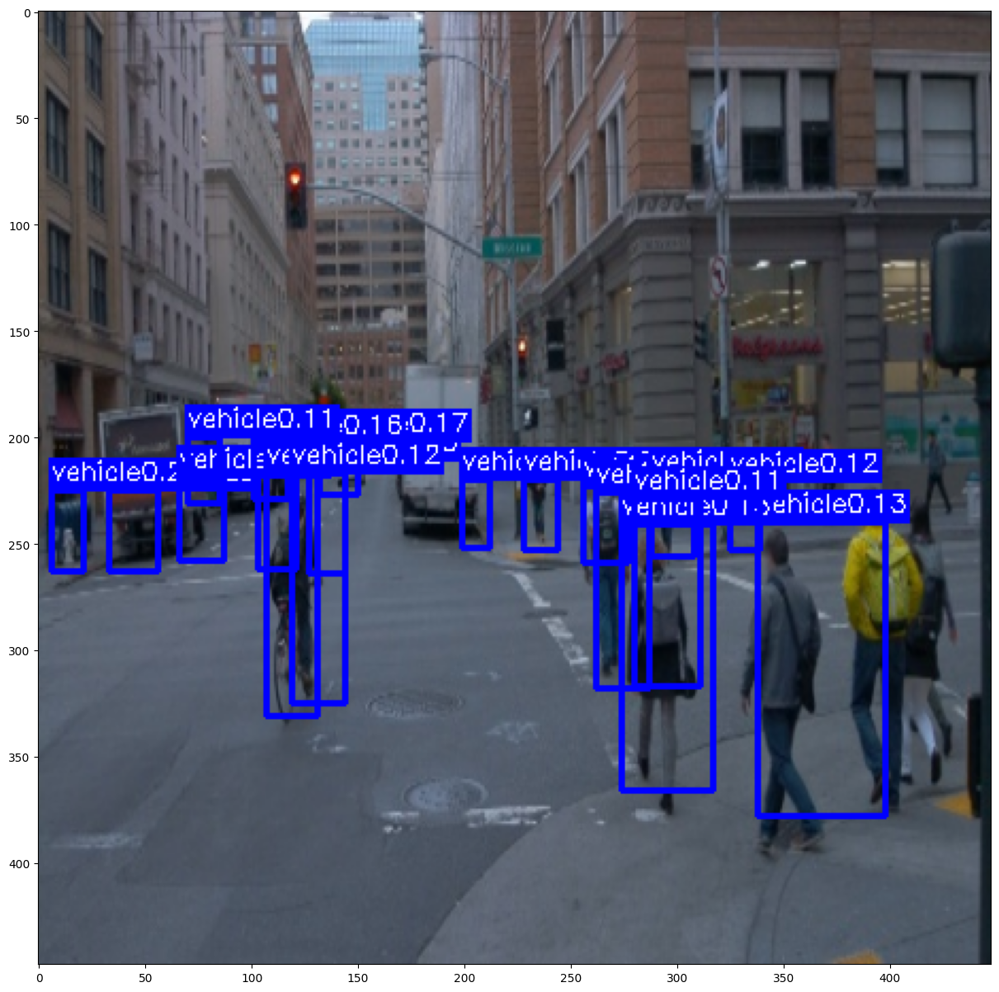

1000 / 8163
Epoch [1/1], Iter [1100/8163], Loss: total=165.470, reg=22.152, containing_obj=27.617, no_obj=8.621, cls=24.935
1100 / 8163
Epoch [1/1], Iter [1200/8163], Loss: total=162.748, reg=21.771, containing_obj=26.973, no_obj=9.528, cls=24.537
1200 / 8163
Epoch [1/1], Iter [1300/8163], Loss: total=160.027, reg=21.365, containing_obj=26.396, no_obj=10.390, cls=24.207
1300 / 8163
Epoch [1/1], Iter [1400/8163], Loss: total=157.391, reg=20.985, containing_obj=25.899, no_obj=11.067, cls=23.802
1400 / 8163
Epoch [1/1], Iter [1500/8163], Loss: total=154.923, reg=20.628, containing_obj=25.433, no_obj=11.710, cls=23.422
1500 / 8163
Epoch [1/1], Iter [1600/8163], Loss: total=152.691, reg=20.311, containing_obj=25.037, no_obj=12.235, cls=23.039
1600 / 8163
Epoch [1/1], Iter [1700/8163], Loss: total=150.672, reg=20.037, containing_obj=24.590, no_obj=12.727, cls=22.714
1700 / 8163
Epoch [1/1], Iter [1800/8163], Loss: total=148.755, reg=19.771, containing_obj=24.242, no_obj=13.146, cls=22.373
18

100%|██████████| 492/492 [00:04<00:00, 107.52it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=3.949, reg=0.558, containing_obj=0.482, no_obj=0.938, cls=0.442
Updating best test loss: 1942.74899
predicting...
[[(112, 219), (134, 333), 'vehicle', 1, 0.6022505164146423], [(265, 219), (285, 324), 'vehicle', 1, 0.5146384239196777], [(330, 267), (386, 401), 'vehicle', 1, 0.42704638838768005], [(379, 267), (418, 397), 'vehicle', 1, 0.4220224618911743], [(6, 228), (19, 257), 'vehicle', 1, 0.41473516821861267], [(281, 250), (309, 360), 'vehicle', 1, 0.3710613250732422], [(59, 220), (83, 254), 'vehicle', 1, 0.32827311754226685], [(255, 220), (276, 262), 'vehicle', 1, 0.3072904944419861], [(189, 219), (208, 248), 'vehicle', 1, 0.29602372646331787], [(327, 243), (361, 374), 'vehicle', 1, 0.29089006781578064], [(272, 243), (293, 349), 'vehicle', 1, 0.282077431678772], [(99, 212), (123, 268), 'vehicle', 1,

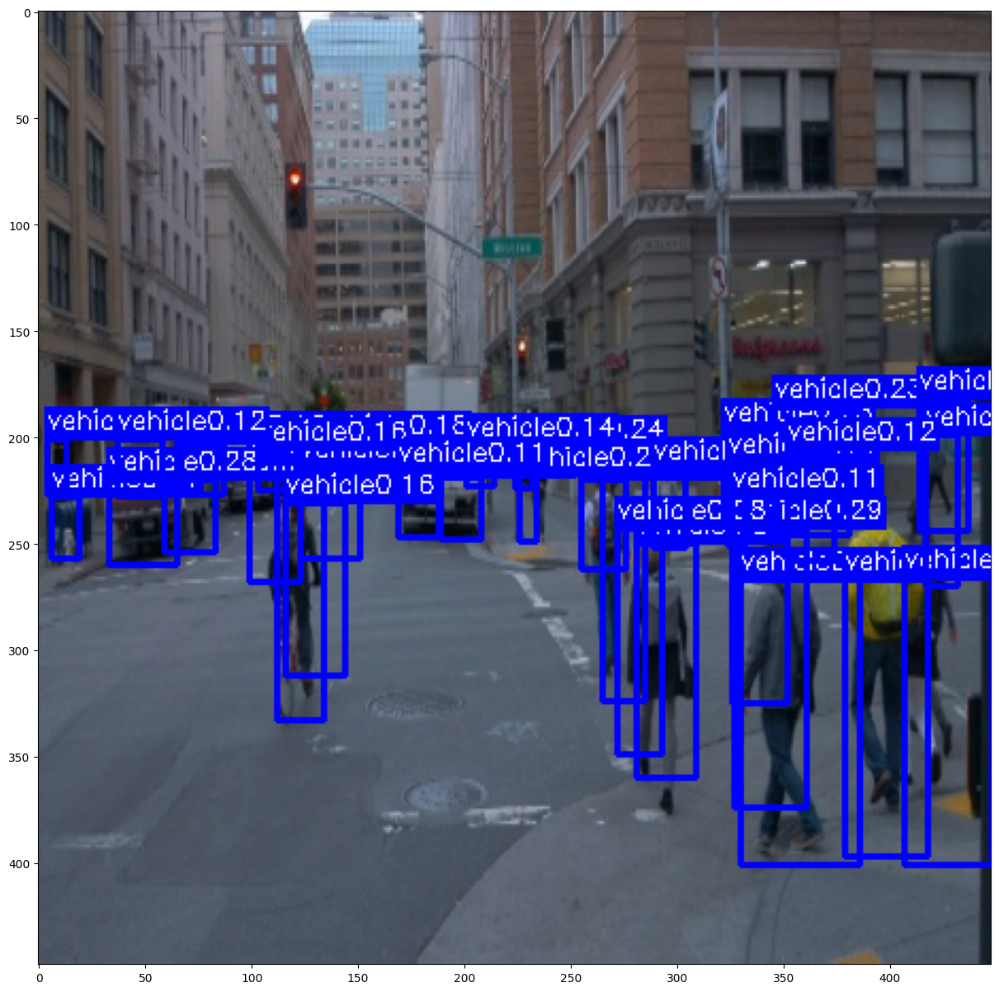

2000 / 8163
Epoch [1/1], Iter [2100/8163], Loss: total=143.860, reg=19.052, containing_obj=23.369, no_obj=14.284, cls=21.658
2100 / 8163
Epoch [1/1], Iter [2200/8163], Loss: total=142.236, reg=18.816, containing_obj=23.091, no_obj=14.598, cls=21.413
2200 / 8163
Epoch [1/1], Iter [2300/8163], Loss: total=140.978, reg=18.632, containing_obj=22.881, no_obj=14.884, cls=21.215
2300 / 8163
Epoch [1/1], Iter [2400/8163], Loss: total=139.612, reg=18.438, containing_obj=22.647, no_obj=15.163, cls=20.986
2400 / 8163
Epoch [1/1], Iter [2500/8163], Loss: total=138.186, reg=18.234, containing_obj=22.413, no_obj=15.379, cls=20.760
2500 / 8163
Epoch [1/1], Iter [2600/8163], Loss: total=136.919, reg=18.053, containing_obj=22.207, no_obj=15.600, cls=20.545
2600 / 8163
Epoch [1/1], Iter [2700/8163], Loss: total=135.773, reg=17.890, containing_obj=22.023, no_obj=15.807, cls=20.348
2700 / 8163
Epoch [1/1], Iter [2800/8163], Loss: total=134.720, reg=17.737, containing_obj=21.851, no_obj=16.002, cls=20.182


100%|██████████| 492/492 [00:03<00:00, 127.20it/s]
/home/albyyuggle/Code/CS498/FP/src/eval_early.py:120: RuntimeWarning: invalid value encountered in true_divide
  rec = tp / float(npos)


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap nan---
---map nan---
0 [0.0, 0.0, nan]
Epoch [1/1], Iter [492/492], Loss: total=3.712, reg=0.497, containing_obj=0.485, no_obj=0.820, cls=0.536
Updating best test loss: 1826.10323
predicting...
[[(116, 234), (131, 319), 'vehicle', 1, 0.844817578792572], [(259, 217), (279, 262), 'vehicle', 1, 0.6755868792533875], [(263, 225), (283, 310), 'vehicle', 1, 0.6722193956375122], [(289, 218), (306, 251), 'vehicle', 1, 0.5650284290313721], [(6, 226), (19, 260), 'vehicle', 1, 0.5616579055786133], [(38, 218), (68, 264), 'vehicle', 1, 0.5305185317993164], [(284, 249), (309, 351), 'vehicle', 1, 0.5143513083457947], [(384, 242), (425, 384), 'vehicle', 1, 0.4990597367286682], [(106, 211), (122, 268), 'vehicle', 1, 0.49139755964279175], [(327, 265), (369, 403), 'vehicle', 1, 0.4582449793815613], [(385, 278), (412, 377), 'vehicle', 1, 0.41064050793647766], [(325, 220), (336, 254), 'vehicle', 1, 0.40006616711616516], [(65, 219),

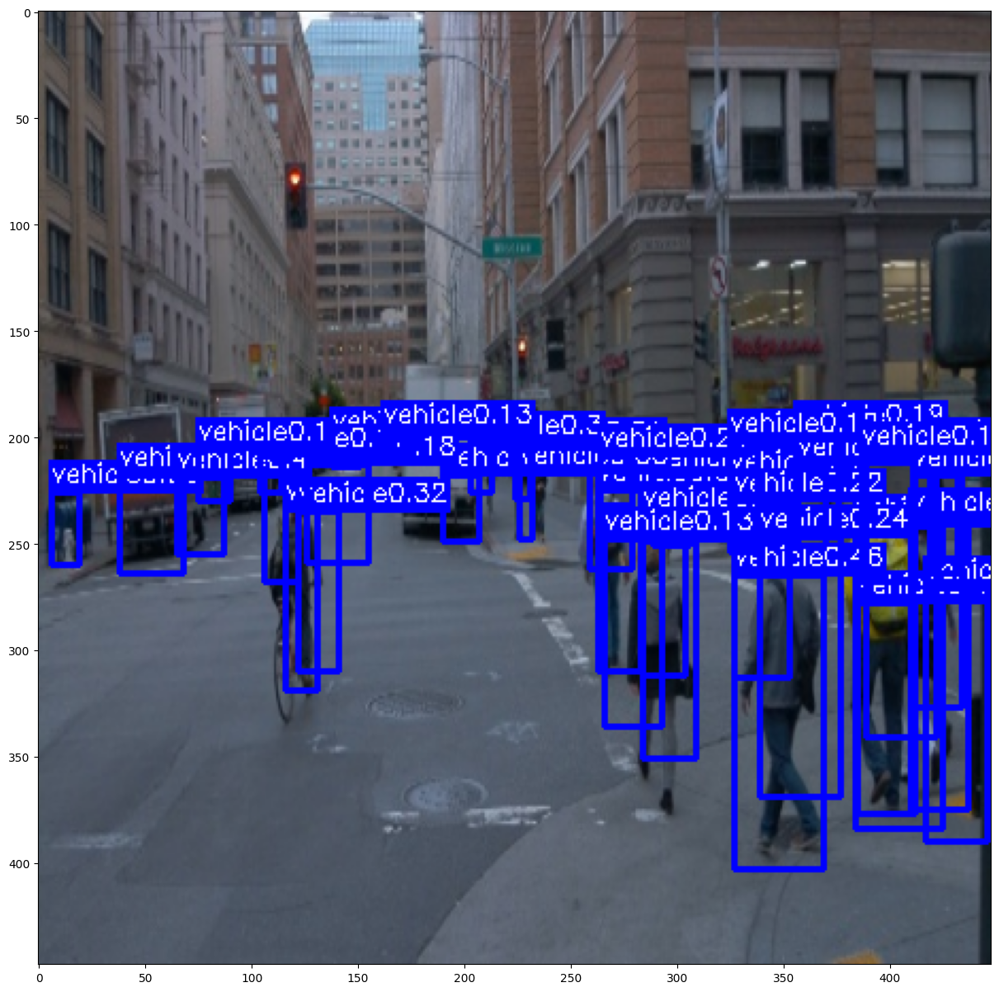

3000 / 8163
Epoch [1/1], Iter [3100/8163], Loss: total=131.426, reg=17.267, containing_obj=21.345, no_obj=16.510, cls=19.616
3100 / 8163
Epoch [1/1], Iter [3200/8163], Loss: total=130.294, reg=17.107, containing_obj=21.172, no_obj=16.632, cls=19.428
3200 / 8163
Epoch [1/1], Iter [3300/8163], Loss: total=129.185, reg=16.953, containing_obj=20.999, no_obj=16.752, cls=19.233
3300 / 8163
Epoch [1/1], Iter [3400/8163], Loss: total=128.214, reg=16.818, containing_obj=20.850, no_obj=16.876, cls=19.053
3400 / 8163
Epoch [1/1], Iter [3500/8163], Loss: total=127.267, reg=16.690, containing_obj=20.698, no_obj=16.983, cls=18.872
3500 / 8163
Epoch [1/1], Iter [3600/8163], Loss: total=126.347, reg=16.561, containing_obj=20.560, no_obj=17.092, cls=18.709
3600 / 8163
Epoch [1/1], Iter [3700/8163], Loss: total=125.504, reg=16.442, containing_obj=20.427, no_obj=17.198, cls=18.566
3700 / 8163
Epoch [1/1], Iter [3800/8163], Loss: total=124.642, reg=16.320, containing_obj=20.302, no_obj=17.298, cls=18.417


100%|██████████| 492/492 [00:03<00:00, 149.01it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=3.423, reg=0.468, containing_obj=0.468, no_obj=0.784, cls=0.420
Updating best test loss: 1684.26828
predicting...
[[(118, 232), (132, 326), 'vehicle', 1, 0.8558748364448547], [(264, 222), (283, 317), 'vehicle', 1, 0.6273456811904907], [(259, 216), (277, 259), 'vehicle', 1, 0.6084842681884766], [(284, 247), (306, 360), 'vehicle', 1, 0.5429364442825317], [(5, 222), (21, 259), 'vehicle', 1, 0.5427298545837402], [(290, 215), (302, 247), 'vehicle', 1, 0.5336479544639587], [(330, 260), (368, 407), 'vehicle', 1, 0.5195969343185425], [(387, 240), (425, 382), 'vehicle', 1, 0.517488956451416], [(35, 213), (70, 260), 'vehicle', 1, 0.4263884127140045], [(105, 210), (121, 272), 'vehicle', 1, 0.417186975479126], [(387, 274), (411, 377), 'vehicle', 1, 0.359773725271225], [(323, 217), (331, 249), 'vehicle', 1, 0.344

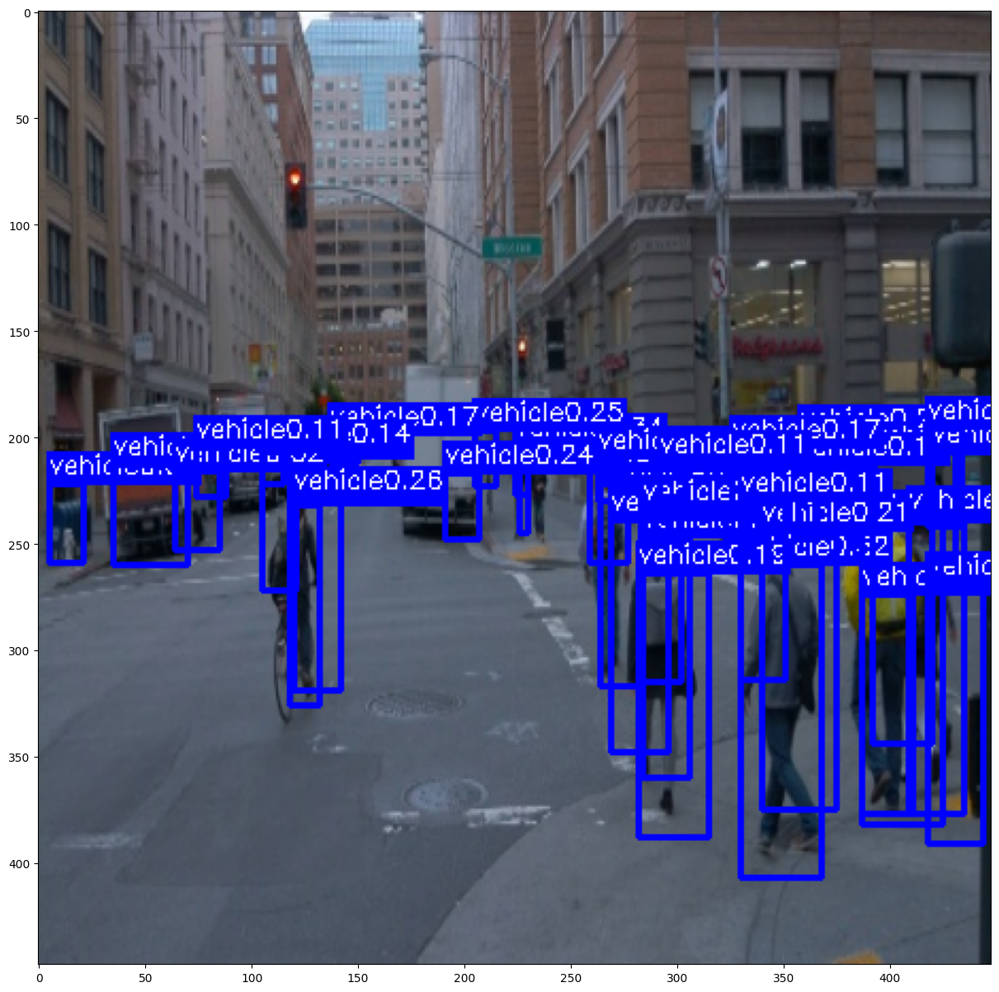

4000 / 8163
Epoch [1/1], Iter [4100/8163], Loss: total=122.312, reg=15.996, containing_obj=19.954, no_obj=17.528, cls=17.995
4100 / 8163
Epoch [1/1], Iter [4200/8163], Loss: total=121.560, reg=15.892, containing_obj=19.842, no_obj=17.602, cls=17.856
4200 / 8163
Epoch [1/1], Iter [4300/8163], Loss: total=120.941, reg=15.806, containing_obj=19.748, no_obj=17.676, cls=17.742
4300 / 8163
Epoch [1/1], Iter [4400/8163], Loss: total=120.259, reg=15.711, containing_obj=19.646, no_obj=17.733, cls=17.626
4400 / 8163
Epoch [1/1], Iter [4500/8163], Loss: total=119.640, reg=15.623, containing_obj=19.562, no_obj=17.794, cls=17.514
4500 / 8163
Epoch [1/1], Iter [4600/8163], Loss: total=119.101, reg=15.546, containing_obj=19.487, no_obj=17.863, cls=17.417
4600 / 8163
Epoch [1/1], Iter [4700/8163], Loss: total=118.478, reg=15.458, containing_obj=19.403, no_obj=17.921, cls=17.302
4700 / 8163
Epoch [1/1], Iter [4800/8163], Loss: total=117.907, reg=15.379, containing_obj=19.323, no_obj=17.965, cls=17.198


100%|██████████| 492/492 [00:03<00:00, 148.96it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=3.447, reg=0.465, containing_obj=0.474, no_obj=0.819, cls=0.445
predicting...
[[(117, 229), (133, 328), 'vehicle', 1, 0.8119093775749207], [(263, 222), (283, 315), 'vehicle', 1, 0.6216161251068115], [(259, 216), (276, 258), 'vehicle', 1, 0.612097978591919], [(283, 245), (307, 363), 'vehicle', 1, 0.5656042098999023], [(289, 216), (302, 245), 'vehicle', 1, 0.555702805519104], [(389, 241), (422, 379), 'vehicle', 1, 0.5434617400169373], [(4, 222), (21, 259), 'vehicle', 1, 0.5255312919616699], [(331, 259), (368, 408), 'vehicle', 1, 0.5143793821334839], [(35, 211), (70, 259), 'vehicle', 1, 0.43571314215660095], [(105, 211), (121, 270), 'vehicle', 1, 0.4342893660068512], [(387, 273), (411, 377), 'vehicle', 1, 0.35999247431755066], [(322, 218), (331, 248), 'vehicle', 1, 0.3498895764350891], [(224, 205), (230

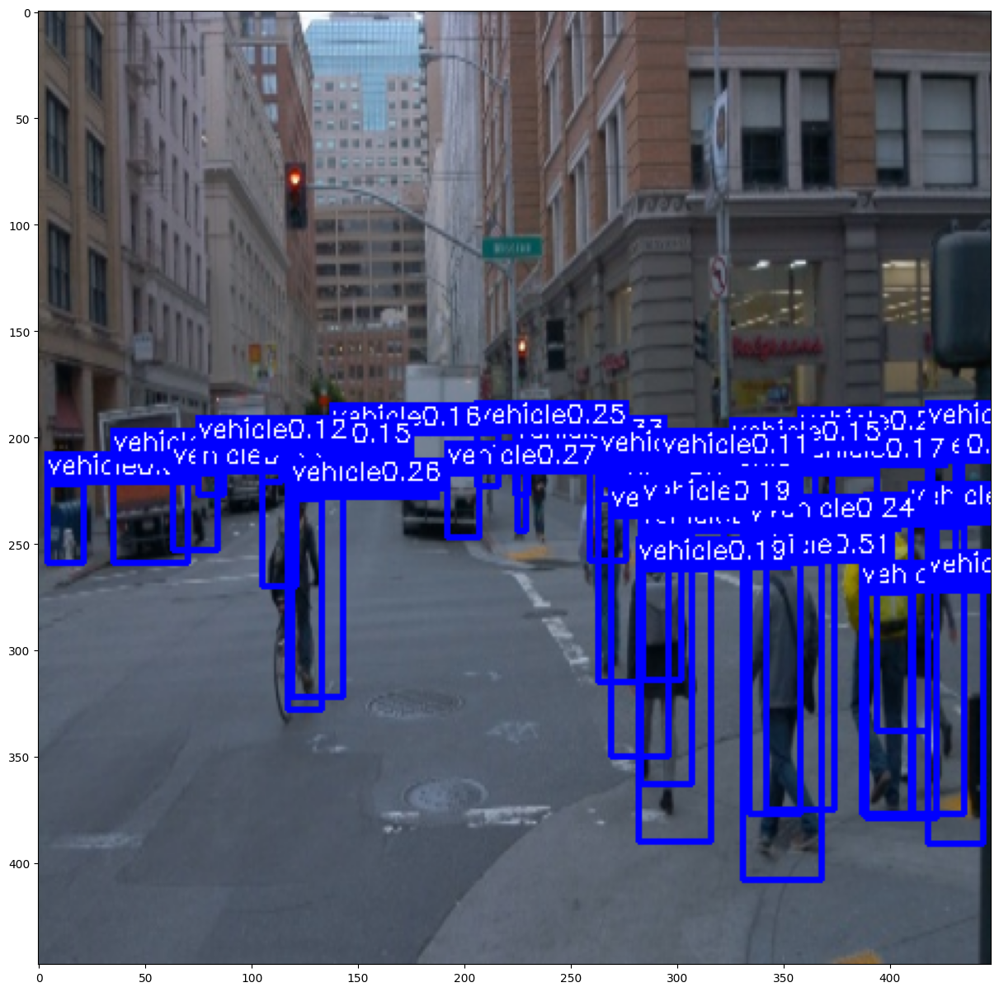

5000 / 8163
Epoch [1/1], Iter [5100/8163], Loss: total=116.411, reg=15.168, containing_obj=19.105, no_obj=18.120, cls=16.936
5100 / 8163
Epoch [1/1], Iter [5200/8163], Loss: total=115.903, reg=15.095, containing_obj=19.033, no_obj=18.165, cls=16.853
5200 / 8163
Epoch [1/1], Iter [5300/8163], Loss: total=115.455, reg=15.032, containing_obj=18.968, no_obj=18.212, cls=16.772
5300 / 8163
Epoch [1/1], Iter [5400/8163], Loss: total=115.042, reg=14.973, containing_obj=18.914, no_obj=18.270, cls=16.695
5400 / 8163
Epoch [1/1], Iter [5500/8163], Loss: total=114.593, reg=14.911, containing_obj=18.850, no_obj=18.300, cls=16.614
5500 / 8163
Epoch [1/1], Iter [5600/8163], Loss: total=114.219, reg=14.859, containing_obj=18.795, no_obj=18.336, cls=16.546
5600 / 8163
Epoch [1/1], Iter [5700/8163], Loss: total=113.784, reg=14.801, containing_obj=18.732, no_obj=18.375, cls=16.454
5700 / 8163
Epoch [1/1], Iter [5800/8163], Loss: total=113.401, reg=14.745, containing_obj=18.677, no_obj=18.404, cls=16.400


100%|██████████| 492/492 [00:03<00:00, 148.63it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=3.473, reg=0.466, containing_obj=0.477, no_obj=0.729, cls=0.486
predicting...
[[(117, 229), (133, 328), 'vehicle', 1, 0.8313343524932861], [(264, 222), (285, 317), 'vehicle', 1, 0.6812615990638733], [(260, 217), (277, 259), 'vehicle', 1, 0.6029520034790039], [(283, 243), (307, 365), 'vehicle', 1, 0.5600878596305847], [(289, 216), (302, 246), 'vehicle', 1, 0.5521770715713501], [(390, 241), (423, 381), 'vehicle', 1, 0.5483614802360535], [(4, 221), (20, 259), 'vehicle', 1, 0.5079826712608337], [(330, 259), (369, 407), 'vehicle', 1, 0.5078020691871643], [(105, 210), (121, 272), 'vehicle', 1, 0.4521659314632416], [(34, 210), (71, 261), 'vehicle', 1, 0.42867469787597656], [(387, 273), (412, 377), 'vehicle', 1, 0.38784176111221313], [(225, 205), (230, 228), 'vehicle', 1, 0.3541937470436096], [(360, 201), (3

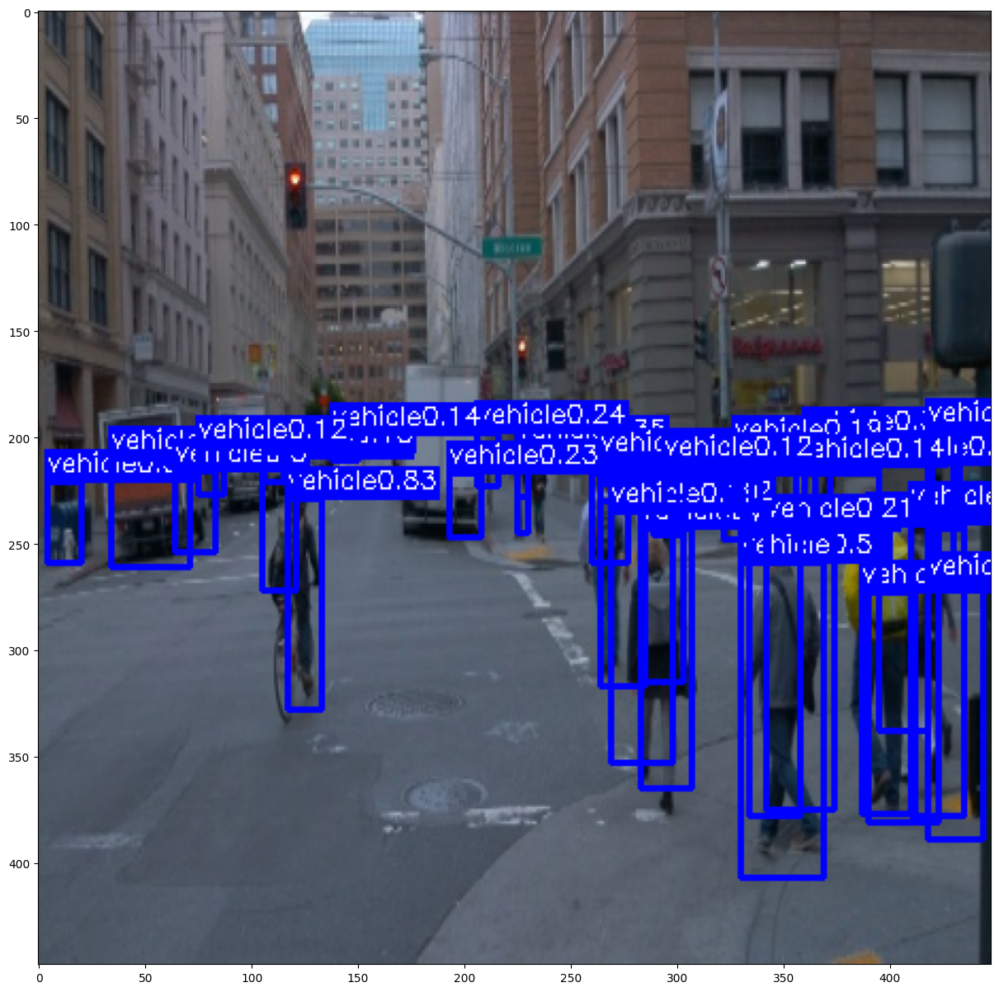

6000 / 8163
Epoch [1/1], Iter [6100/8163], Loss: total=112.322, reg=14.593, containing_obj=18.520, no_obj=18.503, cls=16.211
6100 / 8163
Epoch [1/1], Iter [6200/8163], Loss: total=112.027, reg=14.551, containing_obj=18.478, no_obj=18.532, cls=16.162
6200 / 8163
Epoch [1/1], Iter [6300/8163], Loss: total=111.649, reg=14.497, containing_obj=18.428, no_obj=18.567, cls=16.096
6300 / 8163
Epoch [1/1], Iter [6400/8163], Loss: total=111.342, reg=14.452, containing_obj=18.391, no_obj=18.594, cls=16.042
6400 / 8163
Epoch [1/1], Iter [6500/8163], Loss: total=111.021, reg=14.407, containing_obj=18.348, no_obj=18.618, cls=15.983
6500 / 8163
Epoch [1/1], Iter [6600/8163], Loss: total=110.718, reg=14.364, containing_obj=18.304, no_obj=18.652, cls=15.932
6600 / 8163
Epoch [1/1], Iter [6700/8163], Loss: total=110.437, reg=14.325, containing_obj=18.267, no_obj=18.675, cls=15.874
6700 / 8163
Epoch [1/1], Iter [6800/8163], Loss: total=110.114, reg=14.280, containing_obj=18.217, no_obj=18.699, cls=15.821


100%|██████████| 492/492 [00:03<00:00, 148.54it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=3.450, reg=0.462, containing_obj=0.473, no_obj=0.795, cls=0.467
predicting...
[[(117, 230), (133, 327), 'vehicle', 1, 0.8193061947822571], [(263, 221), (285, 316), 'vehicle', 1, 0.6595293879508972], [(260, 216), (276, 259), 'vehicle', 1, 0.6014615893363953], [(290, 215), (302, 245), 'vehicle', 1, 0.5851026773452759], [(284, 244), (307, 364), 'vehicle', 1, 0.5784443616867065], [(390, 241), (422, 380), 'vehicle', 1, 0.5671150088310242], [(4, 221), (19, 258), 'vehicle', 1, 0.528043806552887], [(331, 259), (369, 407), 'vehicle', 1, 0.5049421191215515], [(105, 210), (121, 271), 'vehicle', 1, 0.4686427414417267], [(35, 210), (70, 260), 'vehicle', 1, 0.4677157998085022], [(387, 272), (411, 378), 'vehicle', 1, 0.3805203437805176], [(225, 205), (230, 228), 'vehicle', 1, 0.3697942793369293], [(322, 217), (330,

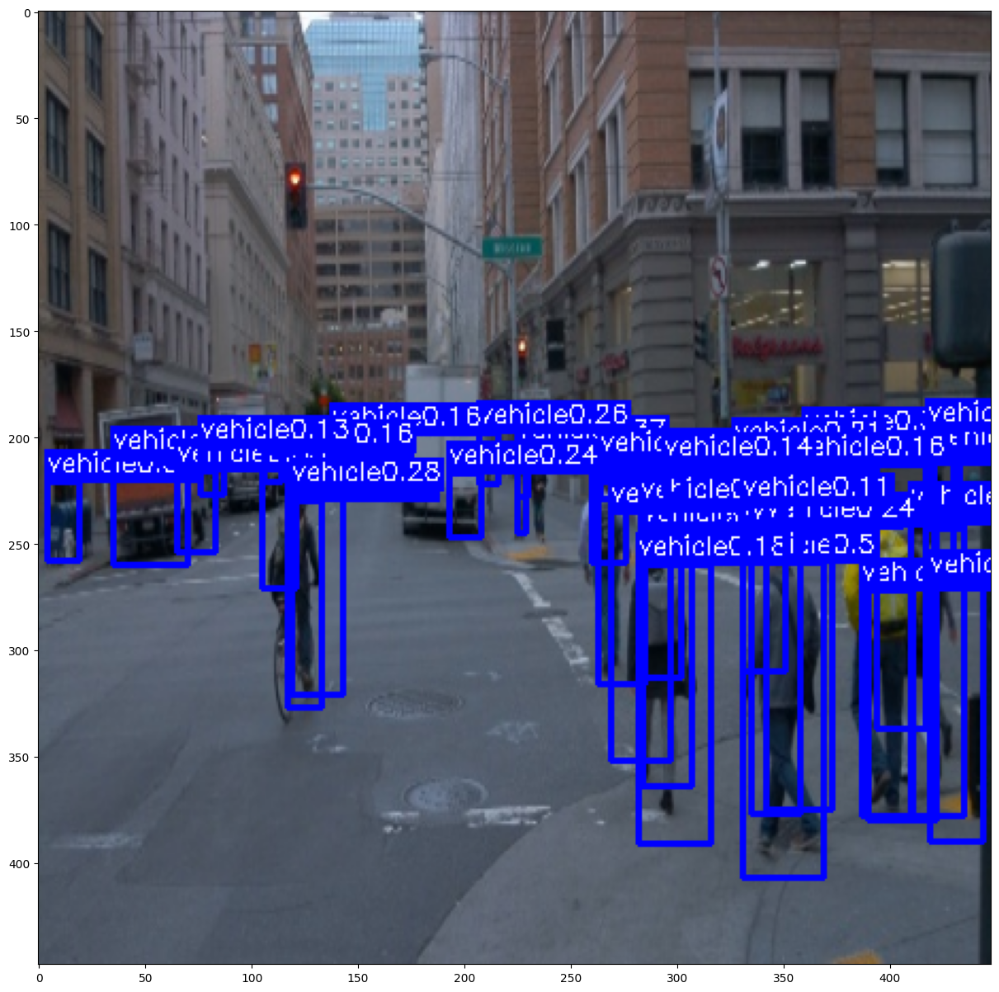

7000 / 8163
Epoch [1/1], Iter [7100/8163], Loss: total=109.317, reg=14.167, containing_obj=18.106, no_obj=18.773, cls=15.680
7100 / 8163
Epoch [1/1], Iter [7200/8163], Loss: total=109.066, reg=14.131, containing_obj=18.072, no_obj=18.792, cls=15.640
7200 / 8163
Epoch [1/1], Iter [7300/8163], Loss: total=108.790, reg=14.094, containing_obj=18.033, no_obj=18.813, cls=15.586
7300 / 8163
Epoch [1/1], Iter [7400/8163], Loss: total=108.566, reg=14.062, containing_obj=17.995, no_obj=18.828, cls=15.554
7400 / 8163
Epoch [1/1], Iter [7500/8163], Loss: total=108.335, reg=14.030, containing_obj=17.964, no_obj=18.846, cls=15.510
7500 / 8163
Epoch [1/1], Iter [7600/8163], Loss: total=108.115, reg=14.000, containing_obj=17.933, no_obj=18.866, cls=15.468
7600 / 8163
Epoch [1/1], Iter [7700/8163], Loss: total=107.889, reg=13.967, containing_obj=17.903, no_obj=18.881, cls=15.432
7700 / 8163
Epoch [1/1], Iter [7800/8163], Loss: total=107.637, reg=13.931, containing_obj=17.866, no_obj=18.906, cls=15.388


100%|██████████| 492/492 [00:03<00:00, 147.36it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0---
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=3.447, reg=0.462, containing_obj=0.475, no_obj=0.782, cls=0.466
predicting...
[[(117, 229), (133, 327), 'vehicle', 1, 0.8223888278007507], [(263, 221), (285, 317), 'vehicle', 1, 0.6656155586242676], [(259, 216), (276, 259), 'vehicle', 1, 0.603396475315094], [(283, 243), (307, 365), 'vehicle', 1, 0.5820304751396179], [(389, 240), (423, 381), 'vehicle', 1, 0.5795436501502991], [(289, 215), (302, 246), 'vehicle', 1, 0.5784278512001038], [(4, 221), (20, 258), 'vehicle', 1, 0.5289159417152405], [(331, 258), (369, 407), 'vehicle', 1, 0.49997419118881226], [(105, 210), (121, 271), 'vehicle', 1, 0.47380274534225464], [(35, 210), (71, 260), 'vehicle', 1, 0.46871381998062134], [(387, 272), (411, 378), 'vehicle', 1, 0.3828795254230499], [(225, 205), (230, 228), 'vehicle', 1, 0.3731310963630676], [(360, 201), (3

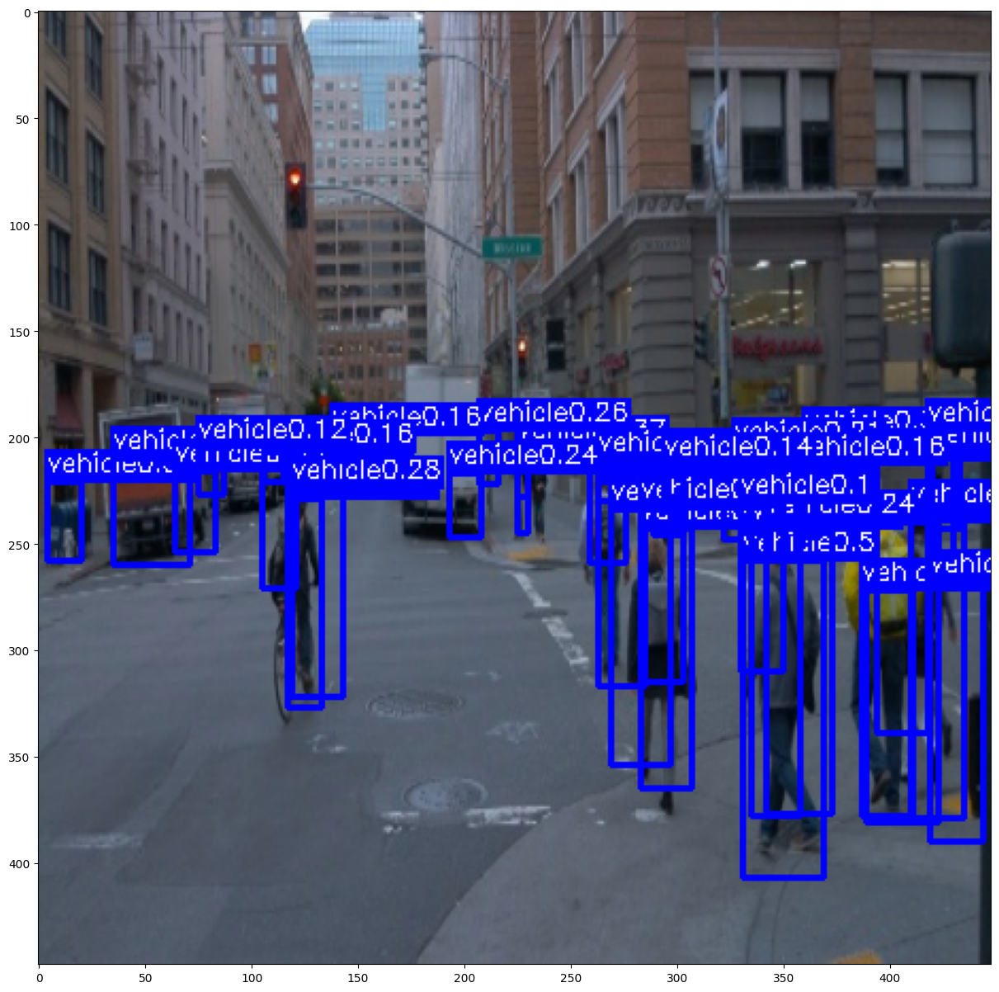

8000 / 8163
Epoch [1/1], Iter [8100/8163], Loss: total=106.935, reg=13.831, containing_obj=17.768, no_obj=18.953, cls=15.275
8100 / 8163


In [8]:
best_test_loss = np.inf
learning_rate = 0.001
for epoch in range(num_epochs):
    net.train()
    
    # Update learning rate late in training
    
    
    print('\n\nStarting epoch %d / %d' % (epoch + 1, num_epochs))
    print('Learning Rate for this epoch: {}'.format(learning_rate))
    
    total_loss = collections.defaultdict(int)
    
    for i, data in enumerate(train_loader):


        if i == 3000 or i == 6000:
            learning_rate /= 10.0

            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate


        data = (item.to(device) for item in data)
        images, target_boxes, target_cls, has_object_map, dimg = data
        dimg = torch.mean(dimg, dim=1, keepdim=True).type(torch.FloatTensor).to('cuda')
        images = torch.cat((images, dimg), dim=1)
        pred = net(images)
        if(i % 100 == 0):
            print(i, "/", len(train_loader))
        # print(pred[:, :, :, -20:])
        loss_dict = criterion(pred, target_boxes, target_cls, has_object_map)
        for key in loss_dict:
            total_loss[key] += loss_dict[key].item()
        
        optimizer.zero_grad()
        loss_dict['total_loss'].backward()
        optimizer.step()
        
        if (i+1) % 100 == 0:
            outstring = 'Epoch [%d/%d], Iter [%d/%d], Loss: ' % ((epoch+1, num_epochs, i+1, len(train_loader)))
            outstring += ', '.join( "%s=%.3f" % (key[:-5], val / (i+1)) for key, val in total_loss.items() )
            print(outstring)
    
    # evaluate the network on the test data
        if (i+1) % 1000 == 0:
            print('evaluating')
            test_aps = evaluate(net, test_loader)
            print(epoch, test_aps)
            with torch.no_grad():
                test_loss = collections.defaultdict(int)
                net.eval()
                for i, data in enumerate(test_loader):
                    data = (item.to(device) for item in data)
                    images, target_boxes, target_cls, has_object_map, dimg, bxs, lbls = data
                    dimg = torch.mean(dimg, dim=1, keepdim=True).type(torch.FloatTensor).to('cuda')
                    images = torch.cat((images, dimg), dim=1)
                    pred = net(images)
                    loss_dict = criterion(pred, target_boxes, target_cls, has_object_map)
                    for key in loss_dict:
                        test_loss[key] += loss_dict[key].item()
            
            outstring = 'Epoch [%d/%d], Iter [%d/%d], Loss: ' % ((epoch+1, num_epochs, i+1, len(test_loader)))
            outstring += ', '.join( "%s=%.3f" % (key[:-5], val / (i+1)) for key, val in test_loss.items() )
            print(outstring)
            if best_test_loss > test_loss['total_loss']:
                best_test_loss = test_loss['total_loss']
                print('Updating best test loss: %.5f' % best_test_loss)
                torch.save(net.state_dict(),'checkpoints/best_detector_early2.pth')

            image_name = "test"
            image = cv2.imread('/home/albyyuggle/Code/CS498/FP/data/30779396576054160_1880_000_1900_000/1557845072664263_cam_1.jpg', cv2.IMREAD_COLOR)

            image = cv2.resize(image, (448, 448))

            image2 = np.copy(image)
            dimg = cv2.imread('/home/albyyuggle/Code/CS498/FP/data/30779396576054160_1880_000_1900_000/1557845072664263_depth_1.jpg', cv2.IMREAD_GRAYSCALE)
            dimg_small = torch.nn.MaxPool2d((4,4), stride=(4,4))(torch.unsqueeze(torch.unsqueeze(torch.tensor(dimg, dtype=torch.float), axis=0), axis=0)).repeat((1,1,1,1))
            dimg_small = dimg_small[0].permute(1,2,0).numpy()
            dimg_small = np.expand_dims(cv2.resize(dimg_small, (448, 448)), axis=-1)

            image = np.concatenate((image, dimg_small), axis=2)
            
            print('predicting...')
            result = predict_image(net, image, dimg_small, image_name=1)
            print(result)
            for left_up, right_bottom, class_name, _, prob in result:
                color = COLORS[VOC_CLASSES.index(class_name)]
                cv2.rectangle(image2, left_up, right_bottom, color, 2)
                label = class_name + str(round(prob, 2))
                text_size, baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
                p1 = (left_up[0], left_up[1] - text_size[1])
                cv2.rectangle(image2, (p1[0] - 2 // 2, p1[1] - 2 - baseline), (p1[0] + text_size[0], p1[1] + text_size[1]),
                            color, -1)
                cv2.putText(image2, label, (p1[0], p1[1] + baseline), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, 8)

            plt.figure(figsize = (15,15))
            plt.imshow(image2)
            plt.show()


        net.train()

    torch.save(net.state_dict(),'checkpoints/detector_early2.pth')
    


# View example predictions

In [4]:
#net.eval()
import cv2
# select random image from test set
image_name = "test"
image = cv2.imread('/home/albyyuggle/Code/CS498/FP/data/30779396576054160_1880_000_1900_000/1557845072664263_cam_1.jpg', cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = cv2.resize(image, (448, 448))
print(image.shape)
print('predicting...')
result = predict_image(net, image, image_name=1)
print(result)
for left_up, right_bottom, class_name, _, prob in result:
    color = COLORS[VOC_CLASSES.index(class_name)]
    cv2.rectangle(image, left_up, right_bottom, color, 2)
    label = class_name + str(round(prob, 2))
    text_size, baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
    p1 = (left_up[0], left_up[1] - text_size[1])
    cv2.rectangle(image, (p1[0] - 2 // 2, p1[1] - 2 - baseline), (p1[0] + text_size[0], p1[1] + text_size[1]),
                  color, -1)
    cv2.putText(image, label, (p1[0], p1[1] + baseline), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, 8)

plt.figure(figsize = (15,15))
plt.imshow(image)


(448, 448, 3)
predicting...


NameError: name 'predict_image' is not defined

## Evaluate on Test

To evaluate detection results we use mAP (mean of average precision over each class)

In [ ]:
test_aps = evaluate(net, test_dataset_file=annotation_file_test, img_root=file_root_test)

### Cell added to get intermediate mAP values for students

In [ ]:
network_paths = ['detector_epoch_%d.pth' % epoch for epoch in [5, 10, 20, 30, 40]]+['detector.pth']
for load_network_path in network_paths:
    print('Loading saved network from {}'.format(load_network_path))
    net_loaded =  resnet50().to(device)
    net_loaded.load_state_dict(torch.load(load_network_path))
    evaluate(net_loaded, test_dataset_file=annotation_file_test)


In [ ]:
output_submission_csv('my_new_solution.csv', test_aps)